In [2]:
##IMPORTING LIBRARIES

#Audio Processing Libraries
import librosa
import librosa.display
from scipy import signal

#For Playing Audios
import IPython.display as ipd

#Array Processing
import numpy as np

#Data Visualization
import matplotlib.pyplot as plt
import seaborn as sns

#Display the confusion matrix
from sklearn.metrics import confusion_matrix

#Deal with .pkl files
import pickle

#Create a dataframe
import pandas as pd

#Transform and encode the categorical targets
from tensorflow.keras.utils import to_categorical
from sklearn.preprocessing import LabelEncoder

#Split dataset
from sklearn.model_selection import train_test_split

import os

#FOR MODEL BUILDING

from keras.layers import *
from keras.models import *
from keras.callbacks import *
from keras import backend as K
from sklearn import metrics
from keras.callbacks import ModelCheckpoint, EarlyStopping
#from keras.wrappers.scikit_learn import KerasClassifier
from tensorflow.keras.utils import plot_model
from tensorflow.keras.models import load_model
from sklearn.model_selection import GridSearchCV
from datetime import datetime


<Figure size 1400x500 with 0 Axes>

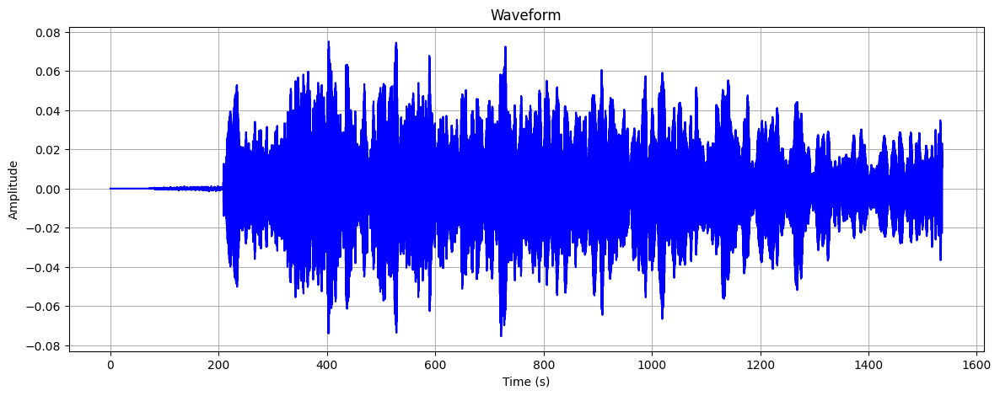

In [4]:
##EXPLORING DATASET
##EMERGENCY

filename = "/home/varalaxmi/Downloads/AudioDataset/sounds/emergency/sound_1.wav"
plt.figure(figsize=(14,5))
data, sample_rate = librosa.load(filename)

#librosa.display.waveshow(data, sr=sample_rate)
# Create the time axis for the waveform
time = librosa.times_like(data, sr=sample_rate)

# Plotting the waveform using matplotlib
plt.figure(figsize=(14, 5))
plt.plot(time, data, color='b')
plt.title('Waveform')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.grid(True)
plt.show()

ipd.Audio(filename)

<Figure size 1400x500 with 0 Axes>

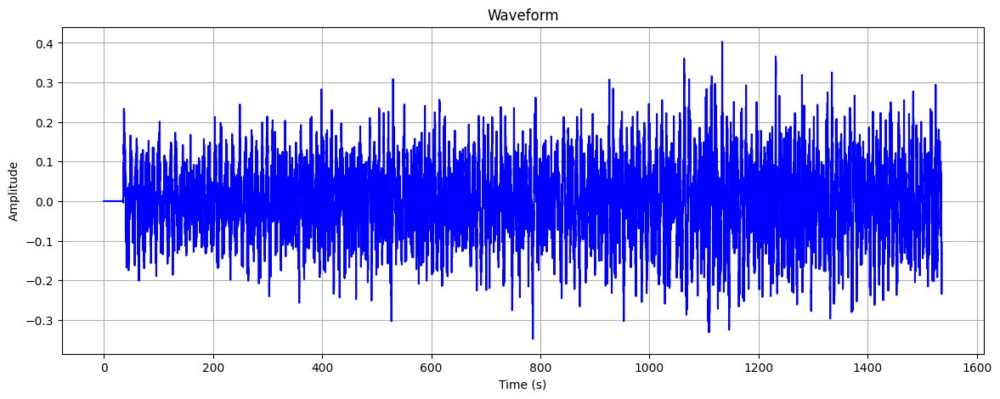

In [5]:
##NON-EMERGENCY

filename = "/home/varalaxmi/Downloads/AudioDataset/sounds/non_emergency/sound_401.wav"
plt.figure(figsize=(14,5))
data, sample_rate = librosa.load(filename)

#librosa.display.waveshow(data, sr=sample_rate)
# Create the time axis for the waveform
time = librosa.times_like(data, sr=sample_rate)

# Plotting the waveform using matplotlib
plt.figure(figsize=(14, 5))
plt.plot(time, data, color='b')
plt.title('Waveform')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.grid(True)
plt.show()

ipd.Audio(filename)

In [6]:
##DATA PREPROCESSING
#Using the function features_extractor to get a 80 MFCCs from each audio

def features_extractor(file_name):
    audio, sample_rate = librosa.load(file_name, res_type='kaiser_fast') 
    mfccs_features = librosa.feature.mfcc(y=audio, sr=sample_rate, n_mfcc=80)
    mfccs_scaled_features = np.mean(mfccs_features.T, axis=0)

    return mfccs_scaled_features

In [7]:
#iterate through every audio file and extract features using Mel-Frequency Cepstral Coefficients

audio_dataset_path = '/home/varalaxmi/Downloads/AudioDataset/sounds/'

extracted_features = []
for path in os.listdir(audio_dataset_path):
    for file in os.listdir(audio_dataset_path+path+"/"):
        if file.lower().endswith(".wav"):
            file_name = audio_dataset_path+path+"/"+file
            data = features_extractor(file_name)  
            extracted_features.append([data, path])

/home/varalaxmi/.local/lib/python3.10/site-packages/librosa/core/spectrum.py:257: UserWarning: n_fft=2048 is too large for input signal of length=1523
  warnings.warn(
/home/varalaxmi/.local/lib/python3.10/site-packages/librosa/core/spectrum.py:257: UserWarning: n_fft=2048 is too large for input signal of length=1323
  warnings.warn(
/home/varalaxmi/.local/lib/python3.10/site-packages/librosa/core/spectrum.py:257: UserWarning: n_fft=2048 is too large for input signal of length=1103
  warnings.warn(


In [10]:
#save the data in a .pkl file

f = open('/home/varalaxmi/Downloads/AudioDataset/Extracted_Features.pkl', 'wb')
pickle.dump(extracted_features, f)
f.close()

In [11]:
#read the extracted features from .pkl file

f = open('/home/varalaxmi/Downloads/AudioDataset/Extracted_Features.pkl', 'rb')
Data = pickle.load(f)
f.close()

In [12]:
#transform data into a dataframe

df = pd.DataFrame(Data,columns=['feature','class'])
df.head()

,feature,class
0,"[-57.586647, 109.33395, -21.945478, 28.576887,...",non_emergency
1,"[-163.78061, 181.55522, -26.63514, 16.061474, ...",non_emergency
2,"[-305.8164, 193.80136, -4.012416, 3.2108254, -...",non_emergency
3,"[-191.97679, 194.95854, -29.679466, 12.071572,...",non_emergency
4,"[53.775787, 115.31232, -18.956942, 50.55644, -...",non_emergency


In [13]:
df['class'].value_counts()

class
emergency        2102
non_emergency    2082
Name: count, dtype: int64

In [14]:
#splitting the data into train and test sets

X = np.array(df['feature'].tolist())
Y = np.array(df['class'].tolist())

In [15]:
print(Y)

['non_emergency' 'non_emergency' 'non_emergency' ... 'emergency'
 'emergency' 'emergency']


In [16]:
X.shape

(4184, 80)

In [17]:
Y.shape

(4184,)

In [18]:
#LABEL ENCODING

labelencoder = LabelEncoder()
y = to_categorical(labelencoder.fit_transform(Y))

In [19]:
Y[0]

'non_emergency'

In [20]:
y[0]

array([0., 1.], dtype=float32)

In [21]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0, stratify=y, shuffle=True)

In [22]:
y_train.shape

(3347, 2)

In [23]:
#Display the shape of each split

X_train.shape

(3347, 80)

In [24]:
X_test.shape

(837, 80)

In [25]:
y_test.shape

(837, 2)

In [26]:
#MODEL BUILDING 
#CNN 

X_train_features  = X_train.reshape(len(X_train),-1,1)
X_test_features = X_test.reshape(len(X_test),-1,1)
print("Reshaped Array Size", X_train_features.shape)

Reshaped Array Size (3347, 80, 1)


In [27]:
X_train.shape

(3347, 80)

In [28]:
def cnn(optimizer="adam", activation="relu", dropout_rate=0.5):
    K.clear_session()
    inputs = Input(shape=(X_train_features.shape[1], X_train_features.shape[2]))
    
    #First Conv1D layer
    conv = Conv1D(3, 13, padding='same', activation=activation)(inputs)
    if dropout_rate != 0:
        conv = Dropout(dropout_rate)(conv)
    conv = MaxPooling1D(2)(conv)

    #Second Conv1D layer
    conv = Conv1D(16, 11, padding='same', activation=activation)(conv)
    if dropout_rate != 0:
        conv = Dropout(dropout_rate)(conv)
    conv = MaxPooling1D(2)(conv)
    
    #MaxPooling 1D
    conv = GlobalMaxPool1D()(conv)
    
    #Dense Layer 
    conv = Dense(16, activation=activation)(conv)
    outputs = Dense(y_test.shape[1], activation='softmax')(conv)
    
    model = Model(inputs, outputs)
    model.compile(loss='binary_crossentropy',optimizer=optimizer,metrics=['acc'])
    return model

In [29]:
model_cnn = cnn(optimizer="adam", activation="relu", dropout_rate=0)
model_cnn.summary()

2024-02-06 12:29:49.077917: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:901] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-02-06 12:29:51.094770: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:901] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-02-06 12:29:51.095490: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:901] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 80, 1)]           0         
                                                                 
 conv1d (Conv1D)             (None, 80, 3)             42        
                                                                 
 max_pooling1d (MaxPooling1  (None, 40, 3)             0         
 D)                                                              
                                                                 
 conv1d_1 (Conv1D)           (None, 40, 16)            544       
                                                                 
 max_pooling1d_1 (MaxPoolin  (None, 20, 16)            0         
 g1D)                                                            
                                                                 
 global_max_pooling1d (Glob  (None, 16)                0     

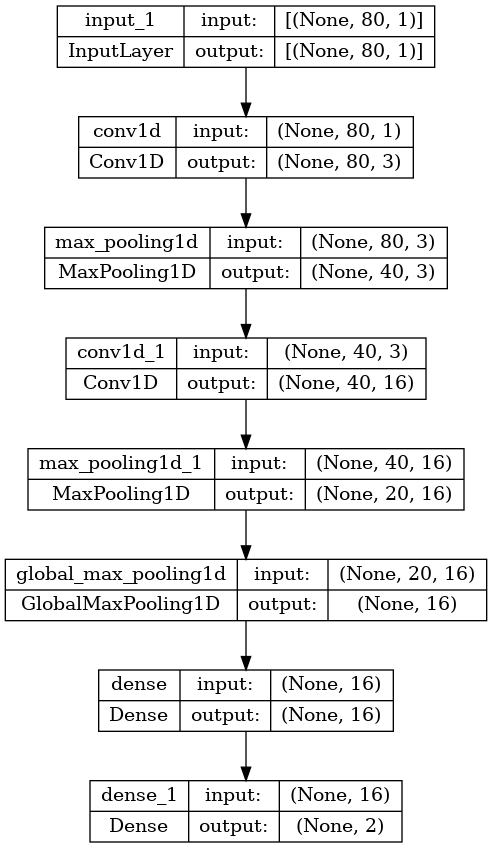

In [30]:
plot_model(model_cnn, show_shapes=True, show_layer_names=True)

In [31]:
#early_stop = EarlyStopping(monitor = 'val_acc', mode ='max',
#                          patience = 10, restore_best_weights = True)

#history = model_cnn.fit(X_train_features, y_train, epochs = 200, 
#                       callbacks = [early_stop],
#                       batch_size = 64, validation_data = (X_test_features, y_test))


history = model_cnn.fit(X_train_features, y_train, epochs = 200, 
                       batch_size = 64, validation_data = (X_test_features, y_test))


Epoch 1/200


2024-02-06 12:30:04.257769: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:454] Loaded cuDNN version 8907
2024-02-06 12:30:09.242956: I external/local_xla/xla/service/service.cc:168] XLA service 0x7f1ef4732f20 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2024-02-06 12:30:09.243014: I external/local_xla/xla/service/service.cc:176]   StreamExecutor device (0): NVIDIA GeForce GTX 1650, Compute Capability 7.5
2024-02-06 12:30:09.402649: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:269] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
I0000 00:00:1707202809.839602    7944 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


53/53 [==============================] - 10s 17ms/step - loss: 3.0881 - acc: 0.6152 - val_loss: 0.5569 - val_acc: 0.7527
Epoch 2/200
53/53 [==============================] - 0s 6ms/step - loss: 0.4886 - acc: 0.7858 - val_loss: 0.4517 - val_acc: 0.8076
Epoch 3/200
53/53 [==============================] - 0s 6ms/step - loss: 0.4237 - acc: 0.8219 - val_loss: 0.4179 - val_acc: 0.8423
Epoch 4/200
53/53 [==============================] - 0s 6ms/step - loss: 0.3910 - acc: 0.8342 - val_loss: 0.3858 - val_acc: 0.8399
Epoch 5/200
53/53 [==============================] - 0s 6ms/step - loss: 0.3675 - acc: 0.8461 - val_loss: 0.3797 - val_acc: 0.8483
Epoch 6/200
53/53 [==============================] - 0s 6ms/step - loss: 0.3524 - acc: 0.8512 - val_loss: 0.3530 - val_acc: 0.8710
Epoch 7/200
53/53 [==============================] - 0s 6ms/step - loss: 0.3365 - acc: 0.8617 - val_loss: 0.3393 - val_acc: 0.8650
Epoch 8/200
53/53 [==============================] - 0s 6ms/step - loss: 0.3255 - acc: 0.8679

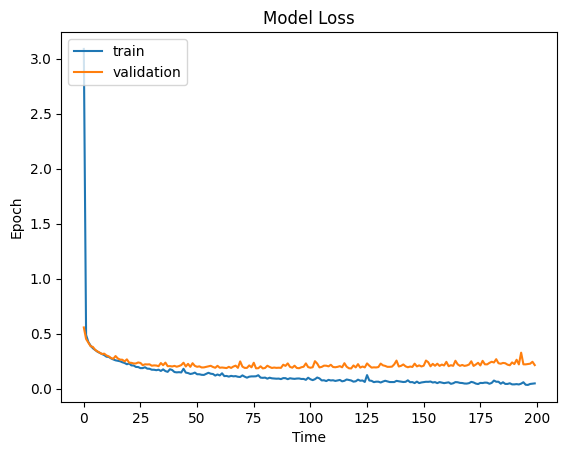

In [32]:
# Summarize History for Loss

plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model Loss')
plt.xlabel('Time')
plt.ylabel('Epoch')
plt.legend(['train', 'validation'], loc = 'upper left')
plt.show()

In [33]:
_, acc = model_cnn.evaluate(X_test_features, y_test)
print("Test Accuracy : ", acc)

27/27 [==============================] - 0s 3ms/step - loss: 0.2146 - acc: 0.9510
Test Accuracy :  0.9510155320167542


27/27 [==============================] - 0s 2ms/step


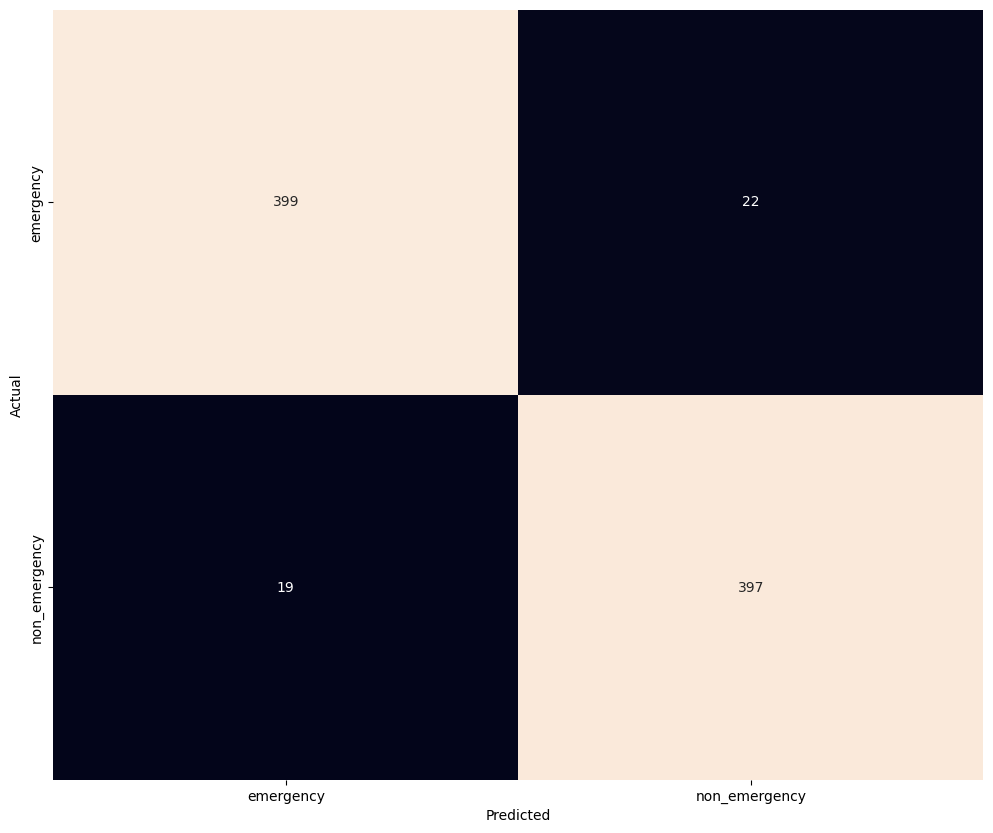

In [34]:
y_pred = model_cnn.predict(X_test_features)

conf_mat = confusion_matrix(np.argmax(y_test, axis=1), np.argmax(y_pred, axis=1))
fig, ax = plt.subplots(figsize=(12,10))
sns.heatmap(conf_mat, annot=True, fmt='d', xticklabels=labelencoder.classes_, yticklabels=labelencoder.classes_, cbar=False)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.show()

In [36]:
# Save the model
model_cnn.save('/home/varalaxmi/Downloads/AudioDataset/cnn_model.h5')

In [37]:
#LSTM

x_train_features  = X_train.reshape(len(X_train),-1, 80)
x_test_features = X_test.reshape(len(X_test), -1, 80)
print("Reshaped Array Size", x_train_features.shape)

Reshaped Array Size (3347, 1, 80)


In [38]:
def lstm(x_tr):
    K.clear_session()
    inputs = Input(shape=(x_tr.shape[1], x_tr.shape[2]))
    #lstm
    x = LSTM(128)(inputs)
    x = Dropout(0.5)(x)
    #dense
    x = Dense(64, activation='relu')(x)
    x = Dense(y_test.shape[1], activation='softmax')(x)
    model = Model(inputs, x)
    model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['acc'])
    return model

In [39]:
model_lstm = lstm(x_train_features)
model_lstm.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 1, 80)]           0         
                                                                 
 lstm (LSTM)                 (None, 128)               107008    
                                                                 
 dropout (Dropout)           (None, 128)               0         
                                                                 
 dense (Dense)               (None, 64)                8256      
                                                                 
 dense_1 (Dense)             (None, 2)                 130       
                                                                 
Total params: 115394 (450.76 KB)
Trainable params: 115394 (450.76 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


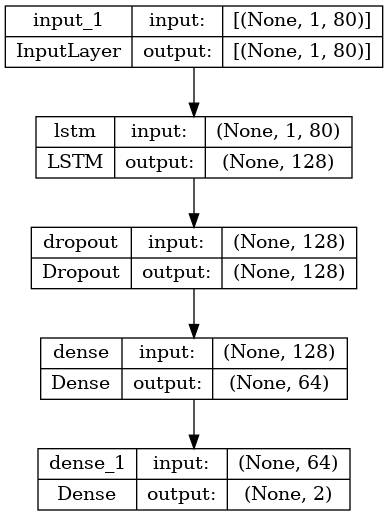

In [40]:
plot_model(model_lstm, show_shapes=True, show_layer_names=True)

In [41]:
mc = ModelCheckpoint('best_model.hdf5', monitor='val_acc', verbose=1, save_best_only=True, mode='max')

In [42]:
history = model_lstm.fit(x_train_features, y_train, epochs = 200,
                        callbacks = [mc],
                        batch_size = 64, validation_data = (x_test_features, y_test))

Epoch 1/200
48/53 [==========================>...] - ETA: 0s - loss: 0.5939 - acc: 0.7103
Epoch 1: val_acc improved from -inf to 0.83751, saving model to best_model.hdf5
53/53 [==============================] - 4s 13ms/step - loss: 0.5828 - acc: 0.7174 - val_loss: 0.4062 - val_acc: 0.8375
Epoch 2/200
28/53 [==============>...............] - ETA: 0s - loss: 0.3937 - acc: 0.8382

/home/varalaxmi/.local/lib/python3.10/site-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


45/53 [========================>.....] - ETA: 0s - loss: 0.3741 - acc: 0.8406
Epoch 2: val_acc improved from 0.83751 to 0.87455, saving model to best_model.hdf5
53/53 [==============================] - 0s 7ms/step - loss: 0.3662 - acc: 0.8437 - val_loss: 0.2861 - val_acc: 0.8746
Epoch 3/200
52/53 [============================>.] - ETA: 0s - loss: 0.2798 - acc: 0.8801
Epoch 3: val_acc improved from 0.87455 to 0.90562, saving model to best_model.hdf5
53/53 [==============================] - 0s 7ms/step - loss: 0.2802 - acc: 0.8799 - val_loss: 0.2204 - val_acc: 0.9056
Epoch 4/200
45/53 [========================>.....] - ETA: 0s - loss: 0.2396 - acc: 0.8979
Epoch 4: val_acc improved from 0.90562 to 0.92832, saving model to best_model.hdf5
53/53 [==============================] - 0s 7ms/step - loss: 0.2326 - acc: 0.9020 - val_loss: 0.1793 - val_acc: 0.9283
Epoch 5/200
44/53 [=======================>......] - ETA: 0s - loss: 0.2037 - acc: 0.9180
Epoch 5: val_acc improved from 0.92832 to 0.94

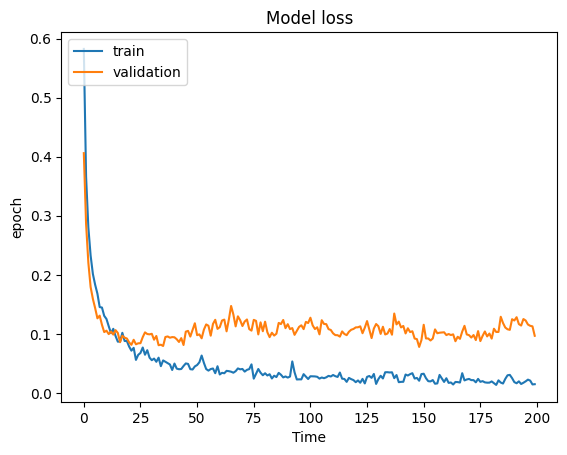

In [43]:
#summarize history for loss
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.xlabel('Time')
plt.ylabel('epoch')
plt.legend(['train','validation'], loc='upper left')
plt.show()

In [44]:
_,acc = model_lstm.evaluate(x_test_features, y_test)
print("Accuracy:", acc)

27/27 [==============================] - 0s 3ms/step - loss: 0.0966 - acc: 0.9761
Accuracy: 0.9761051535606384


27/27 [==============================] - 0s 3ms/step


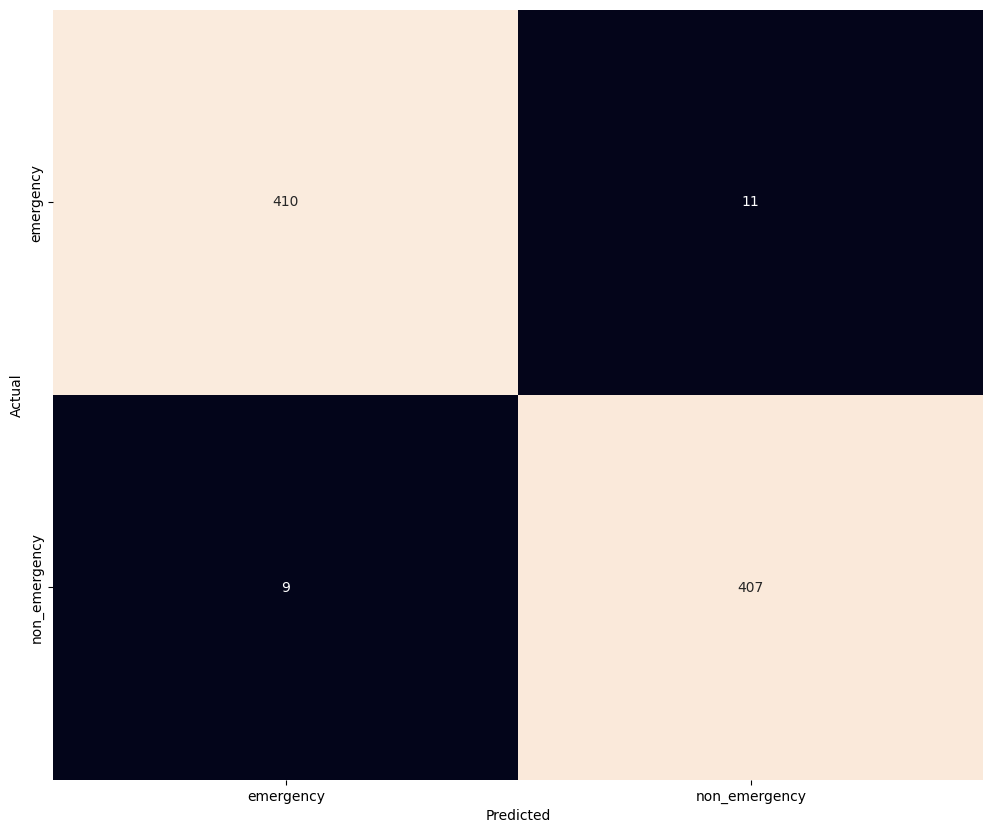

In [45]:
y_pred = model_lstm.predict(x_test_features)

conf_mat = confusion_matrix(np.argmax(y_test, axis=1), np.argmax(y_pred, axis=1))
fig, ax = plt.subplots(figsize=(12,10))
sns.heatmap(conf_mat, annot=True, fmt='d', xticklabels=labelencoder.classes_, yticklabels=labelencoder.classes_, cbar=False)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.show()

In [46]:
# Save the model
model_lstm.save('/home/varalaxmi/Downloads/AudioDataset/lstm_model.h5')

/home/varalaxmi/.local/lib/python3.10/site-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [47]:
#LOADING THE MODEL
#CNN

# Load the saved model
loaded_model = load_model('/home/varalaxmi/Downloads/AudioDataset/cnn_model.h5')

In [71]:
test_audio_file1 = '/home/varalaxmi/Downloads/AudioDataset/testing/road614.wav'
test_audio_features1 = features_extractor(test_audio_file1)

# Reshape the feature array to match the input shape expected by the CNN model
test_audio_features1 = test_audio_features1.reshape(1, test_audio_features1.shape[0], 1)

ipd.Audio(test_audio_file1)

In [72]:
# Make predictions on the preprocessed new audio data using the loaded CNN model
predictions1 = loaded_model.predict(test_audio_features1)

1/1 [==============================] - 0s 23ms/step


In [73]:
print(predictions1)

[[3.6379554e-06 9.9999630e-01]]


In [74]:
predicted_class1 = np.argmax(predictions1, axis=1)
if predicted_class1 == 0:
    print("Emergency vehicle ahead")
# Print the predicted class 
print(f"Predicted Class: {predicted_class1}")

##if o, ambulance elif 1, firetruck , else traffic

Predicted Class: [1]


In [75]:
test_audio_file2 = '/home/varalaxmi/Downloads/AudioDataset/testing/ambulance854.wav'
test_audio_features2 = features_extractor(test_audio_file2)

# Reshape the feature array to match the input shape expected by the CNN model
test_audio_features2 = test_audio_features2.reshape(1, test_audio_features2.shape[0], 1)

ipd.Audio(test_audio_file2)

In [76]:
# Make predictions on the preprocessed new audio data using the loaded CNN model
predictions2 = loaded_model.predict(test_audio_features2)

1/1 [==============================] - 0s 36ms/step


In [77]:
print(predictions2)

[[9.9999917e-01 8.8823248e-07]]


In [79]:
predicted_class2 = np.argmax(predictions2, axis=1)
if predicted_class2 == 0:
    print("Emergency vehicle ahead")
# Print the predicted class 
print(f"Predicted Class: {predicted_class2}")

##if o, ambulance elif 1, firetruck , else traffic

Emergency vehicle ahead
Predicted Class: [0]


In [80]:
#LOADING THE MODEL
#LSTM

# Load the saved model
loaded_model2 = load_model('/home/varalaxmi/Downloads/AudioDataset/lstm_model.h5')

In [91]:
test_audio_file = '/home/varalaxmi/Downloads/AudioDataset/testing/road614.wav'

test_audio_features = features_extractor(test_audio_file)

# Reshape the test_audio_features to match the expected input shape for LSTM model prediction
# Assuming test_audio_features is already a 1D array of shape (80,)
test_audio_features_reshaped = np.expand_dims(test_audio_features, axis=0)  # Add a new axis for the sample dimension
test_audio_features_reshaped = np.expand_dims(test_audio_features_reshaped, axis=0)  # Add a new axis for the sequence length dimension (which is 1 in this case)

ipd.Audio(test_audio_file)

In [92]:
# Make predictions on the preprocessed new audio data using the loaded LSTM model
predictions = loaded_model2.predict(test_audio_features_reshaped)

1/1 [==============================] - 0s 31ms/step


In [93]:
print(predictions)

[[2.1886663e-12 1.0000000e+00]]


In [94]:
predicted_class = np.argmax(predictions, axis=1)
if predicted_class == 0:
    print("Emergency vehicle ahead")
# Print the predicted class 
print(f"Predicted Class: {predicted_class}")

##if o, ambulance elif 1, firetruck , else traffic

Predicted Class: [1]


In [100]:
test_audio_file = '/home/varalaxmi/Downloads/AudioDataset/testing/111671-8-0-9.wav'

test_audio_features = features_extractor(test_audio_file)

# Reshape the test_audio_features to match the expected input shape for LSTM model prediction
# Assuming test_audio_features is already a 1D array of shape (80,)
test_audio_features_reshaped = np.expand_dims(test_audio_features, axis=0)  # Add a new axis for the sample dimension
test_audio_features_reshaped = np.expand_dims(test_audio_features_reshaped, axis=0)  # Add a new axis for the sequence length dimension (which is 1 in this case)

ipd.Audio(test_audio_file)

In [101]:
# Make predictions on the preprocessed new audio data using the loaded LSTM model
predictions = loaded_model2.predict(test_audio_features_reshaped)

1/1 [==============================] - 0s 27ms/step


In [102]:
print(predictions)

[[1.0000000e+00 5.0377387e-25]]


In [103]:
predicted_class = np.argmax(predictions, axis=1)
if predicted_class == 0:
    print("Emergency vehicle ahead")
# Print the predicted class 
print(f"Predicted Class: {predicted_class}")

##if o, ambulance elif 1, firetruck , else traffic

Emergency vehicle ahead
Predicted Class: [0]
